In [1]:
# Importing libraries numpy and pandas
import numpy as np
import pandas as pd

# Importing libraries seaborn for plots
import seaborn as sns
import matplotlib.pyplot as plt

# Importing KnnImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder

# Importing the warnings package to ingore
import warnings
warnings.filterwarnings("ignore")

#scaling
from sklearn.preprocessing import StandardScaler

In [2]:
# Importing the data
data = pd.read_csv('V3.csv')

In [3]:
data.head()

,Date,Year,Locality,Estimated Value,Sale Price,Property,Residential,num_rooms,num_bathrooms,carpet_area,property_tax_rate,Face
0,2009-01-02,2009,Waterbury,111440.0,185000.0,Single Family,Detached House,3,3,996.0,1.025953,South
1,2009-01-02,2009,NaN,73080.0,152000.0,Single Family,Detached House,3,1,935.0,1.025953,North
2,2009-01-02,2009,Waterbury,50540.0,105000.0,Single Family,Detached House,3,1,951.0,1.025953,East
3,2009-01-02,2009,Norwalk,571060.0,1000000.0,Single Family,Detached House,3,2,NaN,1.025953,South
4,2009-01-02,2009,Bridgeport,4775276.0,272900.0,Single Family,Detached House,3,1,971.0,1.025953,East


In [4]:
#Drop the column date
data = data.drop('Date',axis=1)

In [5]:
# Checking for all the information for the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               10000 non-null  int64  
 1   Locality           8745 non-null   object 
 2   Estimated Value    8771 non-null   float64
 3   Sale Price         10000 non-null  float64
 4   Property           10000 non-null  object 
 5   Residential        10000 non-null  object 
 6   num_rooms          10000 non-null  int64  
 7   num_bathrooms      10000 non-null  int64  
 8   carpet_area        8718 non-null   float64
 9   property_tax_rate  10000 non-null  float64
 10  Face               10000 non-null  object 
dtypes: float64(4), int64(3), object(4)
memory usage: 859.5+ KB


In [6]:
column_names = data.columns.tolist()

In [7]:
# uniforming the column names
data.rename(columns=lambda x: x.strip().lower(), inplace=True) 

In [8]:
# checking for numerical distribution
data.describe()


,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate
count,10000.000000,8.771000e+03,1.000000e+04,10000.000000,10000.000000,8718.000000,10000.000000
mean,2015.880100,4.445842e+05,6.224748e+05,3.329600,2.334000,1111.658981,1.143517
std,4.088031,7.513565e+05,1.029709e+06,0.885123,1.209293,305.058455,0.166762
min,2009.000000,0.000000e+00,2.000000e+03,3.000000,1.000000,900.000000,1.003979
25%,2012.000000,1.305250e+05,1.600000e+05,3.000000,1.000000,960.000000,1.023495
50%,2016.000000,2.431800e+05,3.400000e+05,3.000000,2.000000,1021.000000,1.025899
75%,2019.000000,4.418300e+05,6.300000e+05,3.000000,3.000000,1082.000000,1.348259
max,2022.000000,2.111991e+07,2.575000e+07,8.000000,8.000000,2989.000000,1.422308


In [9]:
# Cheking for the duplicated values
data.duplicated().sum()


0

In [10]:
# Chicking for null values
data.isna().sum()

year                    0
locality             1255
estimated value      1229
sale price              0
property                0
residential             0
num_rooms               0
num_bathrooms           0
carpet_area          1282
property_tax_rate       0
face                    0
dtype: int64

In [11]:
object_columns = ['locality', 'property', 'residential','face']


In [12]:
# Sum of unique values in each column
data.nunique()


year                   14
locality                7
estimated value      7697
sale price           2619
property                5
residential             4
num_rooms               4
num_bathrooms           8
carpet_area           861
property_tax_rate      14
face                    4
dtype: int64

In [13]:
# Checking unique values for categorical columns.
for col in object_columns:
    print('for ',col,':', data[col].unique())

for  locality : ['Waterbury' nan 'Norwalk' 'Bridgeport' 'Greenwich' 'Fairfield'
 'West Hartford' 'Stamford']
for  property : ['Single Family' '?' 'Two Family' 'Three Family' 'Four Family']
for  residential : ['Detached House' 'Duplex' 'Triplex' 'Fourplex']
for  face : ['South' 'North' 'East' 'West']


In [14]:
data['property'].value_counts()

Single Family    6797
?                1788
Two Family        851
Three Family      480
Four Family        84
Name: property, dtype: int64

In [15]:
data['property'] = data['property'].map(lambda x:np.nan if x == "?" else x)

In [16]:
data['property'].value_counts()

Single Family    6797
Two Family        851
Three Family      480
Four Family        84
Name: property, dtype: int64

In [17]:
data['locality']

0           Waterbury
1                 NaN
2           Waterbury
3             Norwalk
4          Bridgeport
            ...      
9995              NaN
9996        Greenwich
9997    West Hartford
9998              NaN
9999          Norwalk
Name: locality, Length: 10000, dtype: object

In [18]:
null_percentage = data.isnull().sum()/data.shape[0]*100
null_percentage[null_percentage>0]

locality           12.55
estimated value    12.29
property           17.88
carpet_area        12.82
dtype: float64

In [19]:
null_percentage[null_percentage>=50]


Series([], dtype: float64)

In [20]:
numerical_data = data.select_dtypes(include=np.number)
numerical_data.head()


,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate
0,2009,111440.0,185000.0,3,3,996.0,1.025953
1,2009,73080.0,152000.0,3,1,935.0,1.025953
2,2009,50540.0,105000.0,3,1,951.0,1.025953
3,2009,571060.0,1000000.0,3,2,NaN,1.025953
4,2009,4775276.0,272900.0,3,1,971.0,1.025953


In [21]:
# Importing IterativeImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

IterativeImputer = IterativeImputer()
numerical_imputed_data = pd.DataFrame(IterativeImputer.fit_transform(numerical_data)
                                      , columns = numerical_data.columns)



In [22]:
numerical_imputed_data.head()

,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate
0,2009.0,111440.0,185000.0,3.0,3.0,996.00000,1.025953
1,2009.0,73080.0,152000.0,3.0,1.0,935.00000,1.025953
2,2009.0,50540.0,105000.0,3.0,1.0,951.00000,1.025953
3,2009.0,571060.0,1000000.0,3.0,2.0,1001.77306,1.025953
4,2009.0,4775276.0,272900.0,3.0,1.0,971.00000,1.025953


In [23]:
(numerical_imputed_data.isnull().sum())[numerical_imputed_data.isnull().sum()>0]


Series([], dtype: int64)

In [24]:
scalar = StandardScaler()
numerical_imputed_data= pd.DataFrame(scalar.fit_transform(numerical_imputed_data),
                                columns=numerical_imputed_data.columns)



In [25]:
numerical_imputed_data.head()


,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate
0,-1.683071,-0.452935,-0.424874,-0.372396,0.550762,-0.381224,-0.705015
1,-1.683071,-0.505004,-0.456923,-0.372396,-1.103179,-0.582191,-0.705015
2,-1.683071,-0.535600,-0.502570,-0.372396,-1.103179,-0.529478,-0.705015
3,-1.683071,0.170945,0.366651,-0.372396,-0.276208,-0.362204,-0.705015
4,-1.683071,5.877671,-0.339506,-0.372396,-1.103179,-0.463587,-0.705015


In [26]:
cat_data = data.select_dtypes(include='object')
cat_data.head()

,locality,property,residential,face
0,Waterbury,Single Family,Detached House,South
1,NaN,Single Family,Detached House,North
2,Waterbury,Single Family,Detached House,East
3,Norwalk,Single Family,Detached House,South
4,Bridgeport,Single Family,Detached House,East


In [27]:
(cat_data.isnull().sum()/cat_data.shape[0]*100)[(cat_data.isnull().sum()/cat_data.shape[0]*100)>0]


locality    12.55
property    17.88
dtype: float64

In [28]:
cat_data.head()

,locality,property,residential,face
0,Waterbury,Single Family,Detached House,South
1,NaN,Single Family,Detached House,North
2,Waterbury,Single Family,Detached House,East
3,Norwalk,Single Family,Detached House,South
4,Bridgeport,Single Family,Detached House,East


In [29]:
for col in object_columns:
    category_counts = cat_data[col].value_counts()
    missing_indices = cat_data[col].isnull()
    num_missing = missing_indices.sum()
    random_categories = np.random.choice(category_counts.index, size=num_missing, p=category_counts.values / category_counts.sum())
    cat_data.loc[missing_indices, col] = random_categories



In [30]:
cat_data.isnull().sum()

locality       0
property       0
residential    0
face           0
dtype: int64

In [31]:
non_null_data = pd.concat([numerical_imputed_data, cat_data], axis=1)
non_null_data.head()

,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate,locality,property,residential,face
0,-1.683071,-0.452935,-0.424874,-0.372396,0.550762,-0.381224,-0.705015,Waterbury,Single Family,Detached House,South
1,-1.683071,-0.505004,-0.456923,-0.372396,-1.103179,-0.582191,-0.705015,Norwalk,Single Family,Detached House,North
2,-1.683071,-0.535600,-0.502570,-0.372396,-1.103179,-0.529478,-0.705015,Waterbury,Single Family,Detached House,East
3,-1.683071,0.170945,0.366651,-0.372396,-0.276208,-0.362204,-0.705015,Norwalk,Single Family,Detached House,South
4,-1.683071,5.877671,-0.339506,-0.372396,-1.103179,-0.463587,-0.705015,Bridgeport,Single Family,Detached House,East


In [32]:
non_null_data[non_null_data.duplicated()]

,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate,locality,property,residential,face


In [33]:
non_null_data.drop(9878, inplace=True)

In [34]:
non_null_data[non_null_data.duplicated()]

,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate,locality,property,residential,face


In [35]:
non_null_numerical = non_null_data.select_dtypes(np.number)
non_null_categorical = non_null_data.select_dtypes(exclude = np.number)


In [36]:
non_null_categorical.head()

,locality,property,residential,face
0,Waterbury,Single Family,Detached House,South
1,Norwalk,Single Family,Detached House,North
2,Waterbury,Single Family,Detached House,East
3,Norwalk,Single Family,Detached House,South
4,Bridgeport,Single Family,Detached House,East


In [37]:
encoded_categorical = pd.get_dummies(non_null_categorical, drop_first=True, dtype=int)
encoded_categorical.head()

,locality_Fairfield,locality_Greenwich,locality_Norwalk,locality_Stamford,locality_Waterbury,locality_West Hartford,property_Single Family,property_Three Family,property_Two Family,residential_Duplex,residential_Fourplex,residential_Triplex,face_North,face_South,face_West
0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0
1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0
2,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [38]:
encoded_data = pd.concat([non_null_numerical, encoded_categorical], axis=1)
encoded_data.head()

,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate,locality_Fairfield,locality_Greenwich,locality_Norwalk,...,locality_West Hartford,property_Single Family,property_Three Family,property_Two Family,residential_Duplex,residential_Fourplex,residential_Triplex,face_North,face_South,face_West
0,-1.683071,-0.452935,-0.424874,-0.372396,0.550762,-0.381224,-0.705015,0,0,0,...,0,1,0,0,0,0,0,0,1,0
1,-1.683071,-0.505004,-0.456923,-0.372396,-1.103179,-0.582191,-0.705015,0,0,1,...,0,1,0,0,0,0,0,1,0,0
2,-1.683071,-0.535600,-0.502570,-0.372396,-1.103179,-0.529478,-0.705015,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,-1.683071,0.170945,0.366651,-0.372396,-0.276208,-0.362204,-0.705015,0,0,1,...,0,1,0,0,0,0,0,0,1,0
4,-1.683071,5.877671,-0.339506,-0.372396,-1.103179,-0.463587,-0.705015,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [39]:
encoded_data.shape

(9999, 22)

In [40]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Blues",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot


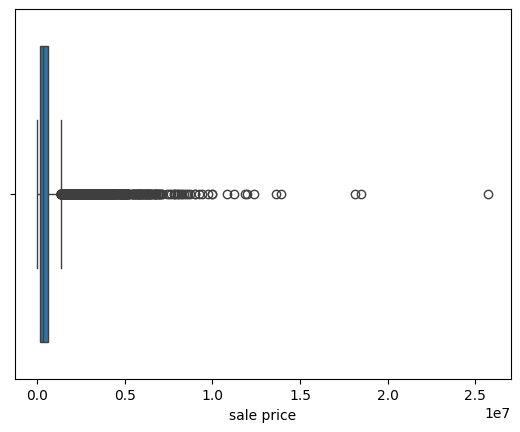

In [41]:
sns.boxplot(x='sale price', data=data);

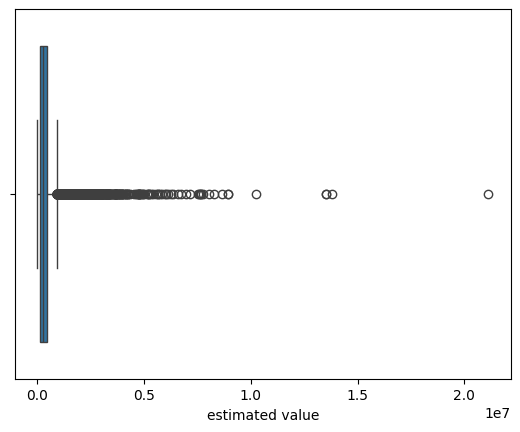

In [42]:
sns.boxplot(x='estimated value', data=data);

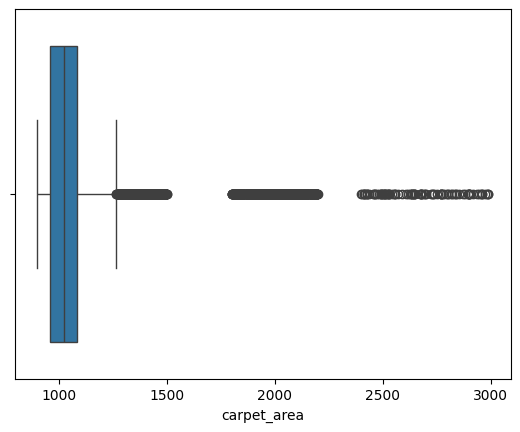

In [43]:
sns.boxplot(x='carpet_area', data=data);

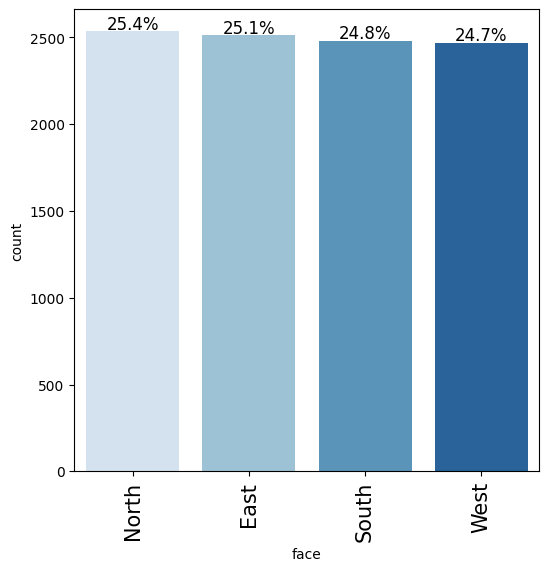

In [44]:
labeled_barplot(data,'face',perc=True);

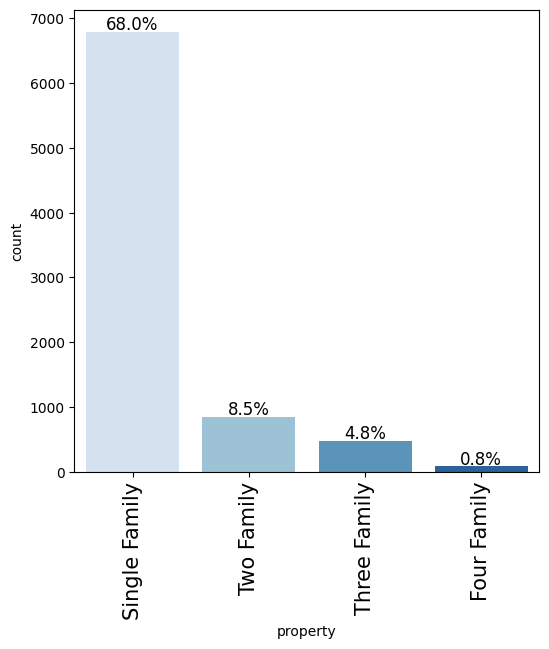

In [45]:
labeled_barplot(data,'property',perc=True);

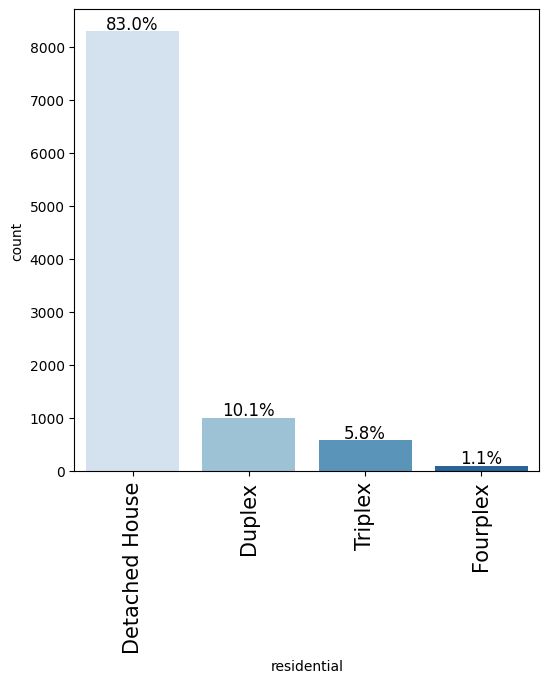

In [46]:
labeled_barplot(data,'residential',perc=True);


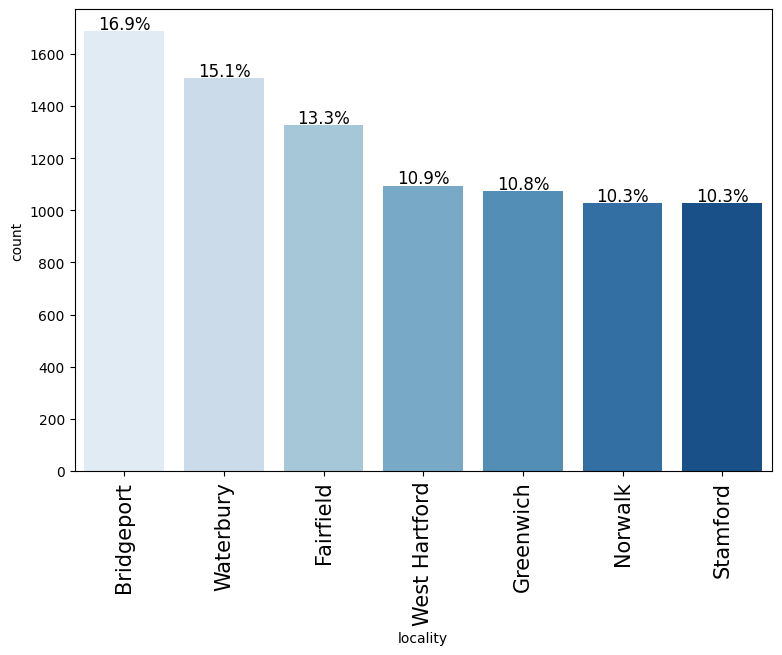

In [48]:
labeled_barplot(data,'locality',perc=True);

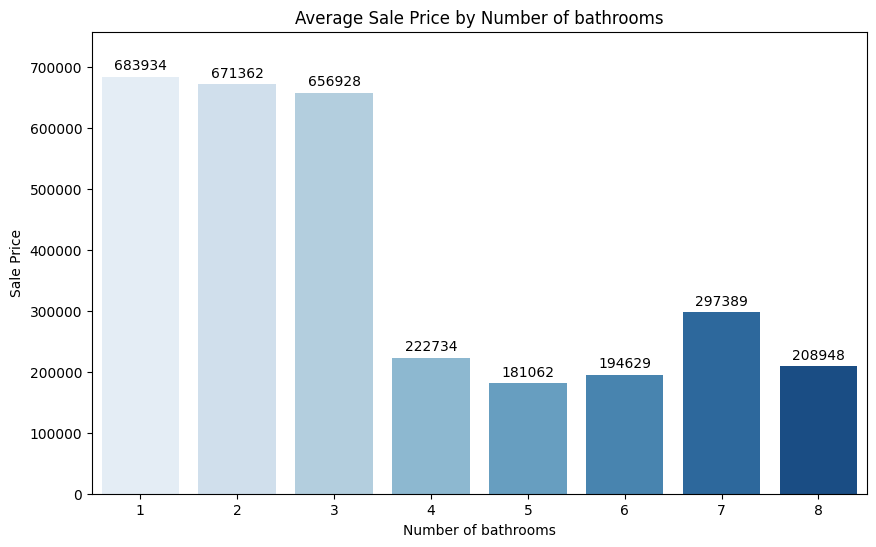

In [49]:
# ## Bivariate Analaysis
plt.figure(figsize=(10, 6))
ax=sns.barplot(x='num_bathrooms', y='sale price', data=data, palette='Blues',errwidth=0)
for p in ax.patches:
    height = p.get_height()
    ax.annotate('{:.0f}'.format(height),
                xy=(p.get_x() + p.get_width() / 2, height),  # Position of the text
                xytext=(0, 3),  # Offset of the text from the bar
                textcoords="offset points",
                ha='center', va='bottom')  # Center align horizontally

plt.xlabel('Number of bathrooms')
plt.ylabel('Sale Price')
plt.title('Average Sale Price by Number of bathrooms')
#plt.xticks(rotation=45)
plt.show()


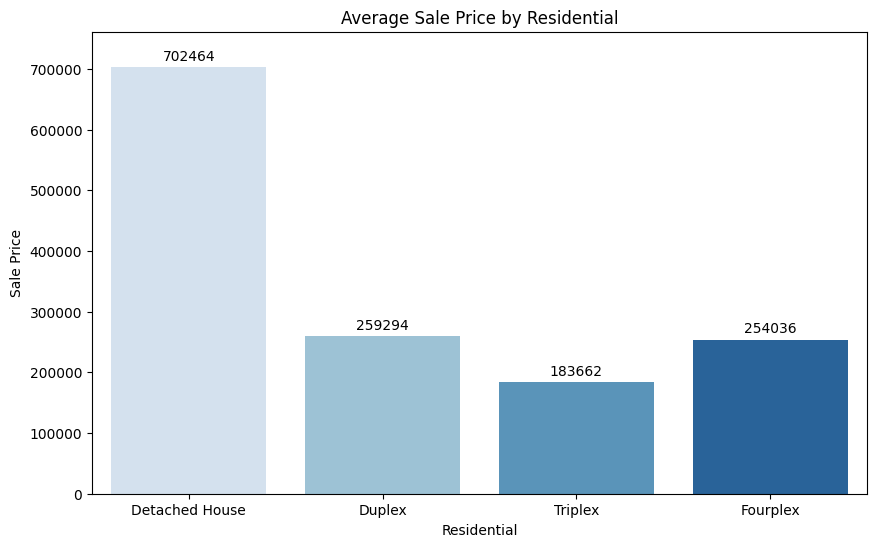

In [44]:
# BarPlot of Residential and average sale price

plt.figure(figsize=(10, 6))
ax=sns.barplot(x='Residential', y='Sale Price', data=data, palette='Blues',errwidth=0)
for p in ax.patches:
    height = p.get_height()
    ax.annotate('{:.0f}'.format(height),
                xy=(p.get_x() + p.get_width() / 2, height),  # Position of the text
                xytext=(0, 3),  # Offset of the text from the bar
                textcoords="offset points",
                ha='center', va='bottom')  # Center align horizontally

plt.xlabel('Residential')
plt.ylabel('Sale Price')
plt.title('Average Sale Price by Residential')
plt.show()

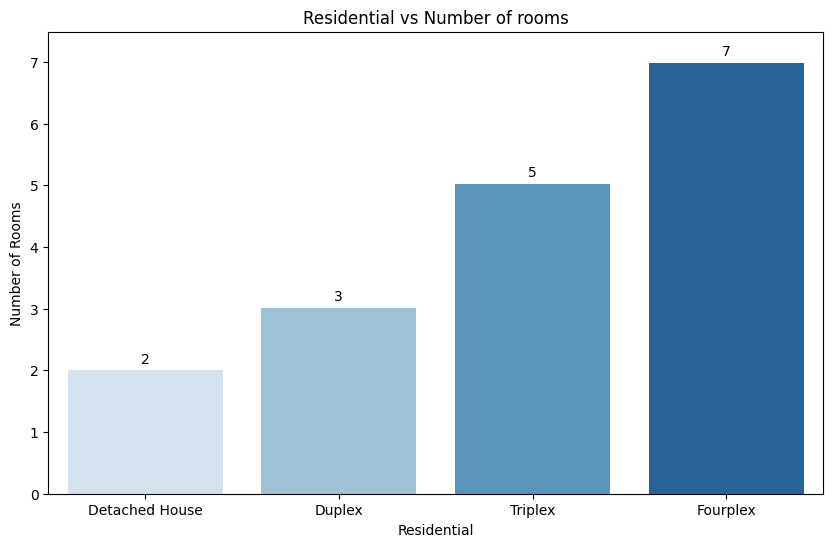

In [50]:
# BarPlot of Residential and number of rooms

plt.figure(figsize=(10, 6))
ax=sns.barplot(x='residential', y='num_bathrooms', data=data, palette='Blues',errwidth=0)
for p in ax.patches:
    height = p.get_height()
    ax.annotate('{:.0f}'.format(height),
                xy=(p.get_x() + p.get_width() / 2, height),  # Position of the text
                xytext=(0, 3),  # Offset of the text from the bar
                textcoords="offset points",
                ha='center', va='bottom')  # Center align horizontally

plt.xlabel('Residential')
plt.ylabel('Number of Rooms')
plt.title('Residential vs Number of rooms')
plt.show()

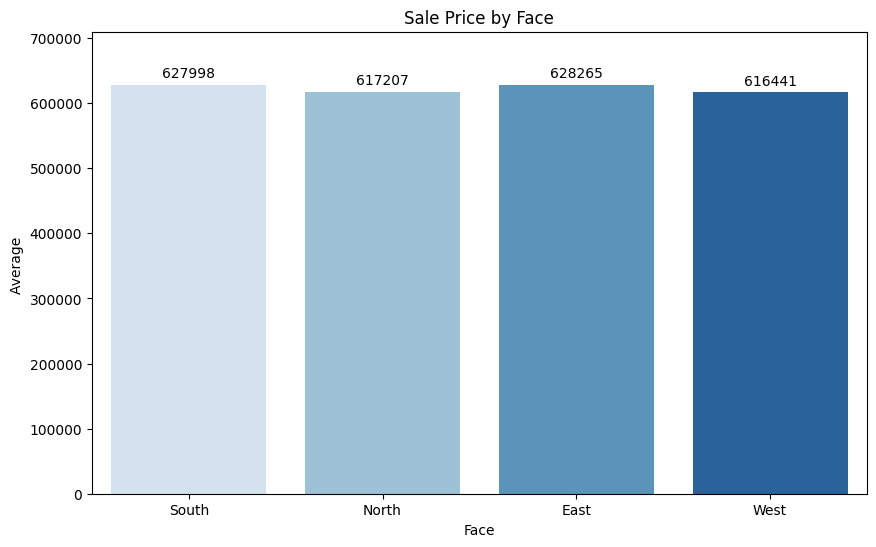

In [51]:
# BarPlot of face of house and average sale price

plt.figure(figsize=(10, 6))
ax=sns.barplot(x='face', y='sale price', data=data, palette='Blues',errwidth=0)
for p in ax.patches:
    height = p.get_height()
    ax.annotate('{:.0f}'.format(height),
                xy=(p.get_x() + p.get_width() / 2, height),  # Position of the text
                xytext=(0, 3),  # Offset of the text from the bar
                textcoords="offset points",
                ha='center', va='bottom')  # Center align horizontally

plt.xlabel('Face')
plt.ylabel('Average ')
plt.title('Sale Price by Face')
plt.show()

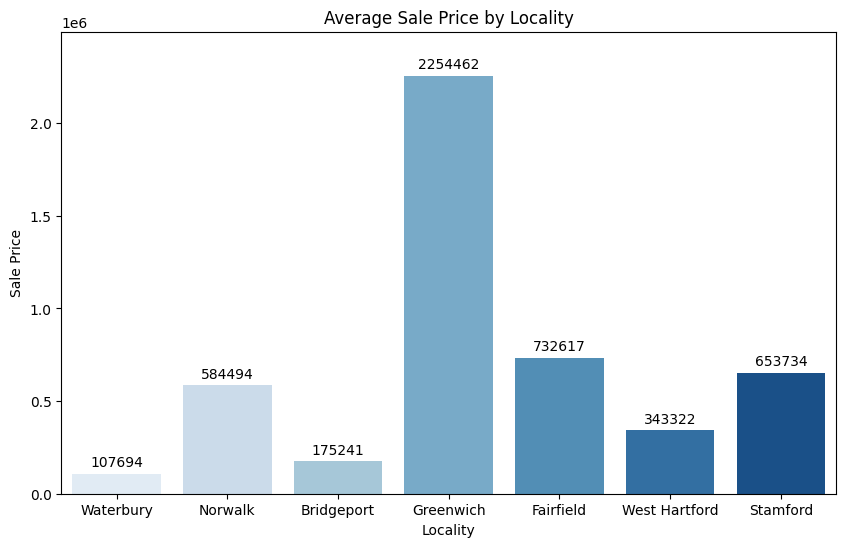

In [52]:
# BarPlot of Locality and average sale price

plt.figure(figsize=(10, 6))
ax=sns.barplot(x='locality', y='sale price', data=data, palette='Blues',errwidth=0)
for p in ax.patches:
    height = p.get_height()
    ax.annotate('{:.0f}'.format(height),
                xy=(p.get_x() + p.get_width() / 2, height),  # Position of the text
                xytext=(0, 3),  # Offset of the text from the bar
                textcoords="offset points",
                ha='center', va='bottom')  # Center align horizontally

plt.xlabel('Locality')
plt.ylabel('Sale Price')
plt.title('Average Sale Price by Locality')
plt.show()

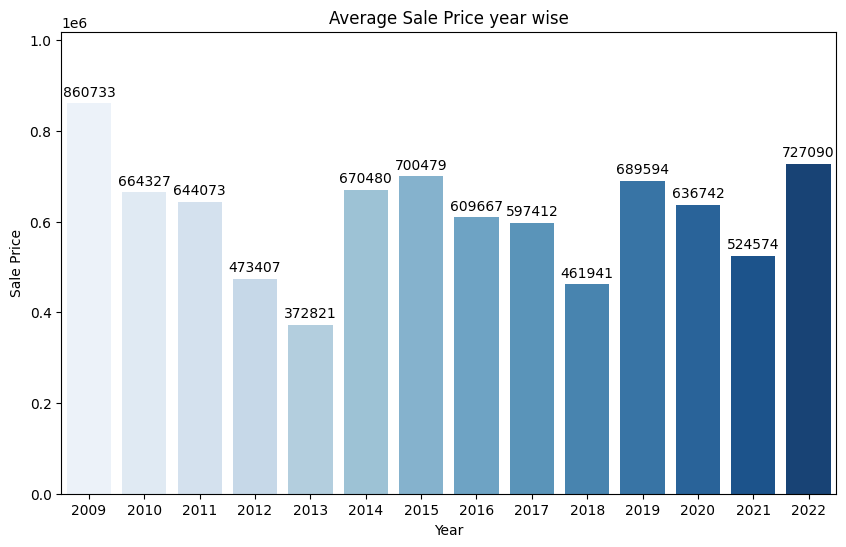

In [48]:
# BarPlot of year and average sale price

plt.figure(figsize=(10, 6))
ax=sns.barplot(x='Year', y='Sale Price', data=data, palette='Blues',errwidth=0)
for p in ax.patches:
    height = p.get_height()
    ax.annotate('{:.0f}'.format(height),
                xy=(p.get_x() + p.get_width() / 2, height),  # Position of the text
                xytext=(0, 3),  # Offset of the text from the bar
                textcoords="offset points",
                ha='center', va='bottom')  # Center align horizontally

plt.xlabel('Year')
plt.ylabel('Sale Price')
plt.title('Average Sale Price year wise')
plt.show()

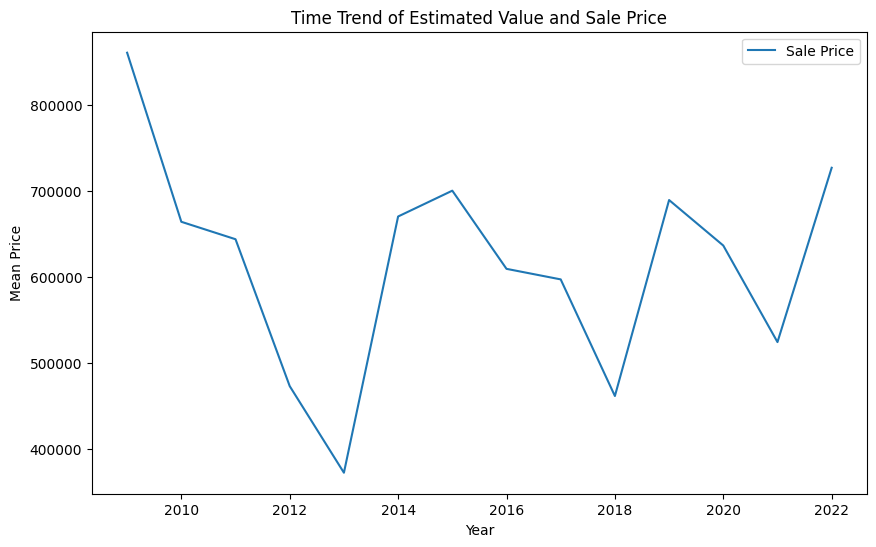

In [54]:
# ## Time Series Analysis
# Time trend for Estimated Value and Sale Price

plt.figure(figsize=(10, 6))
sns.lineplot(x='year', y='sale price', data=data.groupby('year')['sale price'].mean().reset_index())
plt.xlabel('Year')
plt.ylabel('Mean Price')
plt.title('Time Trend of Estimated Value and Sale Price')
plt.legend(['Sale Price'])
plt.show()

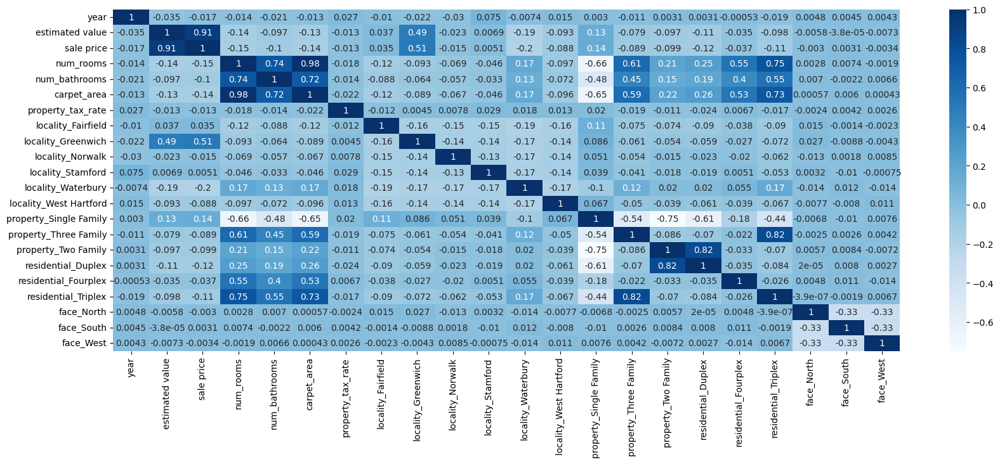

In [55]:
# HeatMap
plt.figure(figsize=(20, 7))
sns.heatmap(encoded_data.corr(),cmap='Blues', annot=True)
plt.show();

In [56]:
#Dropping the column estimated value,num_room to reduce the multicolliniarity
encoded_data = encoded_data.drop(['estimated value','num_rooms'],axis=1)

In [58]:
# Installing the folium, geopy
!pip install folium
!pip install --upgrade pip
!pip install geopy

In [59]:
conda install -c conda-forge folium


Retrieving notices: ...working... done
Solving environment: / 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/osx-arm64::anaconda-navigator==2.5.4=py311hca03da5_1
  - defaults/noarch::conda-pack==0.6.0=pyhd3eb1b0_0
  - defaults/osx-arm64::dask-core==2023.6.0=py311hca03da5_0
  - defaults/osx-arm64::scikit-image==0.20.0=py311h313beb8_0
  - defaults/osx-arm64::numba==0.57.0=py311h7aedaa7_0
  - defaults/osx-arm64::datashader==0.16.0=py311hca03da5_0
  - defaults/osx-arm64::anaconda-project==0.11.1=py311hca03da5_0
  - defaults/osx-arm64::python-lsp-black==1.2.1=py311hca03da5_0
  - defaults/osx-arm64::anaconda-catalogs==0.2.0=py311hca03da5_0
  - defaults/noarch::conda-repo-cli==1.0.4=pyhd3eb1b0_0
  - defaults/noarch::backports.functools_lru_cache==1.6.4=pyhd3eb1b0_0
  - defaults/osx-arm64::twisted==22.10.0=py311h80987f9_0
  - defaults/noarch::pyls-spyder==0.4.0=pyhd3eb1b0_0
  - defaults/osx-arm64::da

In [61]:
# Add new columns
non_null_data['latitude']=None
non_null_data['longitude']=None

#Dictonary mapping city names to la and lo
city_coordinates = {'Waterbury' : [41.5582,-73.052042],
                   'Norwalk' : [41.117808,-73.408247],
                   'Bridgeport' : [41.179114,-73.18939],
                   'Greenwich' : [41.026538,-73.628584],
                   'Fairfield': [41.141003, -73.260927],
                   'West Hartford': [41.761974, -72.742006],
                   'Stamford': [41.053153, -73.539371]
                   }
#Assign latitude and Longitude values 
for city, coordinates in city_coordinates.items():
    city_index = non_null_data[non_null_data['locality'] == city].index
    
    if not city_index.empty:
        non_null_data.loc[city_index, 'latitude'] = coordinates[0]
        non_null_data.loc[city_index, 'longitude'] = coordinates[1]
        
print(data)

      year       locality  estimated value  sale price       property  \
0     2009      Waterbury         111440.0    185000.0  Single Family   
1     2009            NaN          73080.0    152000.0  Single Family   
2     2009      Waterbury          50540.0    105000.0  Single Family   
3     2009        Norwalk         571060.0   1000000.0  Single Family   
4     2009     Bridgeport        4775276.0    272900.0  Single Family   
...    ...            ...              ...         ...            ...   
9995  2022            NaN         155550.0    215000.0   Three Family   
9996  2022      Greenwich              NaN   2162500.0  Single Family   
9997  2022  West Hartford         124740.0    225635.0  Single Family   
9998  2022            NaN        1455230.0   2625000.0  Single Family   
9999  2022        Norwalk         237880.0    430000.0            NaN   

         residential  num_rooms  num_bathrooms  carpet_area  \
0     Detached House          3              3        996.0 

In [62]:
non_null_data.head()

,year,estimated value,sale price,num_rooms,num_bathrooms,carpet_area,property_tax_rate,locality,property,residential,face,latitude,longitude
0,-1.683071,-0.452935,-0.424874,-0.372396,0.550762,-0.381224,-0.705015,Waterbury,Single Family,Detached House,South,41.5582,-73.052042
1,-1.683071,-0.505004,-0.456923,-0.372396,-1.103179,-0.582191,-0.705015,Norwalk,Single Family,Detached House,North,41.117808,-73.408247
2,-1.683071,-0.535600,-0.502570,-0.372396,-1.103179,-0.529478,-0.705015,Waterbury,Single Family,Detached House,East,41.5582,-73.052042
3,-1.683071,0.170945,0.366651,-0.372396,-0.276208,-0.362204,-0.705015,Norwalk,Single Family,Detached House,South,41.117808,-73.408247
4,-1.683071,5.877671,-0.339506,-0.372396,-1.103179,-0.463587,-0.705015,Bridgeport,Single Family,Detached House,East,41.179114,-73.18939


In [63]:
average_sale_price_per_city = non_null_data.groupby('locality')['sale price'].mean()

print("Average Sale Price per City:")
print(average_sale_price_per_city)


Average Sale Price per City:
locality
Bridgeport      -0.380080
Fairfield        0.083239
Greenwich        1.373094
Norwalk         -0.040395
Stamford         0.014073
Waterbury       -0.430907
West Hartford   -0.232768
Name: sale price, dtype: float64


In [64]:
# selected columns 
selected_columns = ['locality', 'latitude', 'longitude','sale price']

# Duplicate DataFrame with only the selected columns
sec_data = non_null_data[selected_columns].copy()


In [65]:
sec_data

,locality,latitude,longitude,sale price
0,Waterbury,41.5582,-73.052042,-0.424874
1,Norwalk,41.117808,-73.408247,-0.456923
2,Waterbury,41.5582,-73.052042,-0.502570
3,Norwalk,41.117808,-73.408247,0.366651
4,Bridgeport,41.179114,-73.18939,-0.339506
...,...,...,...,...
9995,Norwalk,41.117808,-73.408247,-0.395738
9996,Greenwich,41.026538,-73.628584,1.495667
9997,West Hartford,41.761974,-72.742006,-0.385409
9998,Waterbury,41.5582,-73.052042,1.944845


In [66]:
import folium
import pandas as pd

# Calculate average sales price per city
average_prices = sec_data.groupby('locality')['sale price'].mean()

# Create a Folium map centered around Connecticut
m = folium.Map(location=[41.6032, -73.0877], zoom_start=9)

# Add markers for each city on the map
for index, row in sec_data.iterrows():
    # Get the average price for the current locality
    average_price = average_prices.get(row['locality'], 'N/A')
    
    # Customize popup content with locality name and dynamically calculated average price
    popup_content = f"<b>{row['locality']}</b><br>Average Price: ${average_price:,.0f}"
    
    folium.Marker(location=[row['latitude'], row['longitude']], popup=popup_content).add_to(m)

# Display the map
m


In [67]:
#pip install xgboost


In [68]:
print(non_null_data.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 9999 entries, 0 to 9999
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   year               9999 non-null   float64
 1   estimated value    9999 non-null   float64
 2   sale price         9999 non-null   float64
 3   num_rooms          9999 non-null   float64
 4   num_bathrooms      9999 non-null   float64
 5   carpet_area        9999 non-null   float64
 6   property_tax_rate  9999 non-null   float64
 7   locality           9999 non-null   object 
 8   property           9999 non-null   object 
 9   residential        9999 non-null   object 
 10  face               9999 non-null   object 
 11  latitude           9999 non-null   object 
 12  longitude          9999 non-null   object 
dtypes: float64(7), object(6)
memory usage: 1.3+ MB
None


In [69]:
X = encoded_data.drop('sale price',axis=1)
y = encoded_data['sale price']

In [70]:
from sklearn.model_selection import train_test_split

# Splitting data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=11)
print("The dimension of X_train is {}".format(X_train.shape))
print("The dimension of X_test is {}".format(X_test.shape))

The dimension of X_train is (7999, 19)
The dimension of X_test is (2000, 19)


In [71]:
# Importing models to perform the regression

from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge, RidgeCV, Lasso,ElasticNet
from sklearn.model_selection import KFold,GridSearchCV

In [72]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE


    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2
        },
        index=[0],
    )

    return df_perf

In [73]:
##  Function to calculate r2_score and RMSE on train and test data
def get_model_score(model, flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[]

    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    train_r2=metrics.r2_score(y_train,pred_train)
    test_r2=metrics.r2_score(y_test,pred_test)
    train_rmse=np.sqrt(metrics.mean_squared_error(y_train,pred_train))
    test_rmse=np.sqrt(metrics.mean_squared_error(y_test,pred_test))

    #Adding all scores in the list
    score_list.extend((train_r2,test_r2,train_rmse,test_rmse))

    # If the flag is set to True then only the following print statements will be dispayed, the default value is True
    if flag==True:
        print("R-sqaure on training set : ",metrics.r2_score(y_train,pred_train))
        print("R-square on test set : ",metrics.r2_score(y_test,pred_test))
        print("RMSE on training set : ",np.sqrt(metrics.mean_squared_error(y_train,pred_train)))
        print("RMSE on test set : ",np.sqrt(metrics.mean_squared_error(y_test,pred_test)))

    # returning the list with train and test scores
    return score_list

## AdaBoost

In [74]:
ab_regressor=AdaBoostRegressor(random_state=11)
ab_regressor.fit(X_train,y_train)

AdaBoostRegressor(random_state=11)

In [75]:
ab_regressor_model_train_perf = model_performance_regression(ab_regressor, X_train,y_train)
print("Training performance \n",ab_regressor_model_train_perf)

Training performance 
       RMSE       MAE  R-squared  Adj. R-squared
0  1.05893  0.692606  -0.183316       -0.186134


In [76]:
ab_regressor_model_test_perf = model_performance_regression(ab_regressor, X_test,y_test)
print("Testing performance \n",ab_regressor_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  1.145404  0.700451  -0.084813       -0.095223


## Hypertuning AdaBoost

In [77]:
# Choose the type of classifier.
ab_tuned = AdaBoostRegressor(random_state=11)

# Grid of parameters to choose from
parameters = {'n_estimators': np.arange(10,100,10),
              'learning_rate': [1, 0.1, 0.5, 0.01],
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(ab_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
ab_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
ab_tuned.fit(X_train, y_train)

AdaBoostRegressor(learning_rate=0.01, n_estimators=20, random_state=11)

In [78]:
ab_tuned_model_train_perf = model_performance_regression(ab_tuned, X_train,y_train)
print("Training performance \n",ab_tuned_model_train_perf)

Training performance 
       RMSE       MAE  R-squared  Adj. R-squared
0  0.80755  0.378923   0.311816        0.310177


In [79]:
ab_tuned_model_test_perf = model_performance_regression(ab_tuned, X_test,y_test)
print("Testing performance \n",ab_tuned_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.918617  0.387861    0.30224        0.295545


# XGBoost 

In [80]:
xgb_estimator=XGBRegressor(random_state=11, verbosity = 0)
xgb_estimator.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=11, ...)

In [81]:
xgb_estimator_model_train_perf = model_performance_regression(xgb_estimator, X_train, y_train)
print("Training performance \n",xgb_estimator_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.385106  0.210596   0.843495        0.843123


In [82]:
xgb_estimator_model_test_perf = model_performance_regression(xgb_estimator, X_test,y_test)
print("Testing performance \n",xgb_estimator_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.999863  0.417335   0.173356        0.165424


## Hypertunig the XGBoost

In [83]:
# Choose the type of classifier.
xgb_tuned = XGBRegressor(random_state=11, verbosity = 0)

# Grid of parameters to choose from
parameters = {'n_estimators': [75,100,125,150,200,250],
              'subsample':[0.7, 0.8, 0.9, 1],
              'gamma':[0, 1, 3, 5],
              'colsample_bytree':[0.7, 0.8, 0.9, 1],
              'colsample_bylevel':[0.7, 0.8, 0.9, 1]
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None, colsample_bylevel=1,
             colsample_bynode=None, colsample_bytree=0.7, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=5, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, random_state=11, ...)

In [84]:
xgb_tuned_model_train_perf = model_performance_regression(xgb_tuned, X_train, y_train)
print("Training performance \n",xgb_tuned_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.771189  0.353263   0.372393        0.370899


In [85]:
xgb_tuned_model_test_perf = model_performance_regression(xgb_tuned, X_test, y_test)
print("Testing performance \n",xgb_tuned_model_test_perf)

Testing performance 
        RMSE      MAE  R-squared  Adj. R-squared
0  0.929427  0.37441   0.285721        0.278867


## RandomForest

In [86]:
rf_estimator=RandomForestRegressor(random_state=11)
rf_estimator.fit(X_train,y_train)

RandomForestRegressor(random_state=11)

In [87]:
rf_estimator_model_train_perf = model_performance_regression(rf_estimator, X_train,y_train)
print("Training performance \n",rf_estimator_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.323031  0.145836   0.889883        0.889621


In [88]:
rf_estimator_model_test_perf = model_performance_regression(rf_estimator, X_test,y_test)
print("Testing performance \n",rf_estimator_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.966104  0.407445   0.228235        0.220829


## Hypertune Random Forest

In [89]:
# Choose the type of classifier.
rf_tuned = RandomForestRegressor(random_state=11)

# Grid of parameters to choose from
parameters = {
                'max_depth':[4, 6, 8, 10, None],
                'max_features': ['sqrt','log2',None],
                'n_estimators': [80, 90, 100, 110, 120]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(rf_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_tuned.fit(X_train, y_train)

RandomForestRegressor(max_depth=4, max_features=None, random_state=11)

In [90]:
rf_tuned_model_train_perf = model_performance_regression(rf_tuned, X_train, y_train)
print("Training performance \n",rf_tuned_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.790504  0.353991   0.340562        0.338992


In [91]:
rf_tuned_model_test_perf = model_performance_regression(rf_tuned, X_test, y_test)
print("Testing performance \n",rf_tuned_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.912819  0.368914    0.31102        0.304408


In [92]:
folds = KFold(n_splits=10, shuffle=True, random_state=11)
params = {'alpha':[0.001,0.01,0.1,0.2,0.5,0.9,1.0,5.0,10.0]}

## Ridge

In [93]:
model_ridge=Ridge()
model_ridge = GridSearchCV(estimator=model_ridge, 
                            param_grid=params,
                            scoring='r2',
                            cv=folds,
                            return_train_score=True,
                            verbose=1)
model_ridge = model_ridge.fit(X_train,y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


In [94]:
ridge_model_train_perf = model_performance_regression(model_ridge, X_train,y_train)
print("Training performance \n",ridge_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.807539  0.364438   0.311835        0.310196


In [95]:
ridge_model_test_perf = model_performance_regression(model_ridge, X_test, y_test)
print("Testing performance \n",ridge_model_test_perf)

Testing performance 
      RMSE       MAE  R-squared  Adj. R-squared
0  0.9276  0.378643   0.288526        0.281698


In [96]:
model_ridge.best_params_

{'alpha': 1.0}

## Lasso 

In [97]:
lassoReg = Lasso(alpha=5)
model_lasso = GridSearchCV(estimator=lassoReg, 
                            param_grid=params,
                            scoring='r2',
                            cv=folds,
                            return_train_score=True,
                            verbose=1)
model_lasso = model_lasso.fit(X_train,y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


In [98]:
lasso_model_train_perf = model_performance_regression(model_lasso, X_train,y_train)
print("Training performance \n",lasso_model_train_perf)

Training performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.807857  0.363922   0.311293        0.309653


In [99]:
lasso_model_test_perf = model_performance_regression(model_lasso, X_test, y_test)
print("Testing performance \n",lasso_model_test_perf)

Testing performance 
        RMSE       MAE  R-squared  Adj. R-squared
0  0.927542  0.377193   0.288615        0.281789


In [100]:
# training performance comparison

models_train_comp_df = pd.concat(
    [ rf_estimator_model_train_perf.T,rf_tuned_model_train_perf.T,
    ab_regressor_model_train_perf.T,ab_tuned_model_train_perf.T,
    xgb_estimator_model_train_perf.T,xgb_tuned_model_train_perf.T,
     ridge_model_train_perf.T,lasso_model_train_perf.T],
    axis=1,
)

models_train_comp_df.columns = [
    "Random Forest Estimator",
    "Random Forest Tuned",
    "Adaboost Regressor",
    "Adaboost Tuned",
    "XGB",
    "XGB Tuned",
    "Ridge",
    "Lasso"
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Random Forest Estimator,Random Forest Tuned,Adaboost Regressor,Adaboost Tuned,XGB,XGB Tuned,Ridge,Lasso
RMSE,0.323031,0.790504,1.058930,0.807550,0.385106,0.771189,0.807539,0.807857
MAE,0.145836,0.353991,0.692606,0.378923,0.210596,0.353263,0.364438,0.363922
R-squared,0.889883,0.340562,-0.183316,0.311816,0.843495,0.372393,0.311835,0.311293
Adj. R-squared,0.889621,0.338992,-0.186134,0.310177,0.843123,0.370899,0.310196,0.309653


In [101]:
# Testing performance comparison

models_test_comp_df = pd.concat(
    [rf_estimator_model_test_perf.T,rf_tuned_model_test_perf.T,
    ab_regressor_model_test_perf.T,ab_tuned_model_test_perf.T,
    xgb_estimator_model_test_perf.T,xgb_tuned_model_test_perf.T,
     ridge_model_test_perf.T,lasso_model_test_perf.T],
    axis=1,
)

models_test_comp_df.columns = [
    "Random Forest Estimator",
    "Random Forest Tuned",
    "Adaboost Regressor",
    "Adaboost Tuned",
    "XGB",
    "XGB Tuned",
    "Ridge",
    "Lasso"
]

print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Random Forest Estimator,Random Forest Tuned,Adaboost Regressor,Adaboost Tuned,XGB,XGB Tuned,Ridge,Lasso
RMSE,0.966104,0.912819,1.145404,0.918617,0.999863,0.929427,0.927600,0.927542
MAE,0.407445,0.368914,0.700451,0.387861,0.417335,0.374410,0.378643,0.377193
R-squared,0.228235,0.311020,-0.084813,0.302240,0.173356,0.285721,0.288526,0.288615
Adj. R-squared,0.220829,0.304408,-0.095223,0.295545,0.165424,0.278867,0.281698,0.281789
